<a href="https://colab.research.google.com/github/siddhantgupta21/dog-breed-prediction/blob/main/final_dogvision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!kaggle competitions download -c dog-breed-identification

100% 689M/691M [00:12<00:00, 31.5MB/s]
100% 691M/691M [00:12<00:00, 57.8MB/s]


In [ ]:
!ls


dog-breed-identification.zip  kaggle.json


In [ ]:
import zipfile
import os

file_path = '/content/drive/MyDrive/dogbreed/train.zip'
extract_to = '/content/drive/MyDrive/dogbreed/'

# Check if the file exists
if not os.path.exists(file_path):
    print("The file does not exist.")
else:
    # Try to open the ZIP file
    try:
        with zipfile.ZipFile(file_path, 'r') as zip_ref:
            zip_ref.extractall(extract_to)
        print("Extraction successful.")
    except zipfile.BadZipFile:
        print("The file is not a zip file or it is corrupted.")

Extraction successful.


In [ ]:
!unzip "/content/drive/MyDrive/dogbreed/dog-breed-identification.zip" -d "/content/drive/MyDrive/dogbreed/"

Streaming output truncated to the last 5000 lines.
  inflating: /content/drive/MyDrive/dogbreed/train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: /content/drive/MyDrive/dogbreed/train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: /content/drive/MyDrive/dogbreed/train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: /content/drive/MyDrive/dogbreed/train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: /content/drive/MyDrive/dogbreed/train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: /content/drive/MyDrive/dogbreed/train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: /content/drive/MyDrive/dogbreed/train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: /content/drive/MyDrive/dogbreed/train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: /content/drive/MyDrive/dogbreed/train/83fad0718581a696132c96c166472627.jpg  
  inflating: /content/drive/MyDrive/dogbreed/train/83fbbcc9a612e3f712b1ba199da61f20.jpg  
  inflating: /content/drive/MyDrive/dogbreed/trai

In [ ]:
import tensorflow as tf
print("Version:",tf.__version__)

Version: 2.15.0


In [ ]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

# Check for GPU availability
print("GPU", "available (YESSSS!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version: 2.15.0
TF Hub version: 0.16.1
GPU available (YESSSS!!!!!)


In [ ]:
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/dogbreed/labels.csv")
labels_csv

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
...,...,...
10217,ffd25009d635cfd16e793503ac5edef0,borzoi
10218,ffd3f636f7f379c51ba3648a9ff8254f,dandie_dinmont
10219,ffe2ca6c940cddfee68fa3cc6c63213f,airedale
10220,ffe5f6d8e2bff356e9482a80a6e29aac,miniature_pinscher


In [ ]:
!unzip "/content/drive/MyDrive/dogbreed/train.zip"

Archive:  /content/drive/MyDrive/dogbreed/train.zip
  End-of-central-directory signature not found.  Either this file is not
  a zipfile, or it constitutes one disk of a multi-part archive.  In the
  latter case the central directory and zipfile comment will be found on
  the last disk(s) of this archive.
unzip:  cannot find zipfile directory in one of /content/drive/MyDrive/dogbreed/train.zip or
        /content/drive/MyDrive/dogbreed/train.zip.zip, and cannot find /content/drive/MyDrive/dogbreed/train.zip.ZIP, period.


In [ ]:
import zipfile
import os

file_path = '/content/drive/MyDrive/dogbreed/dog-breed-identification.zip'
extract_to = '/content/drive/MyDrive/dogbreed/'

# Check if the file exists
if not os.path.exists(file_path):
    print("The file does not exist.")
else:
    # Try to open the ZIP file
    try:
        with zipfile.ZipFile(file_path, 'r') as zip_ref:
            zip_ref.extractall(extract_to)
        print("Extraction successful.")
    except zipfile.BadZipFile:
        print("The file is not a zip file or it is corrupted.")

Extraction successful.


In [ ]:
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


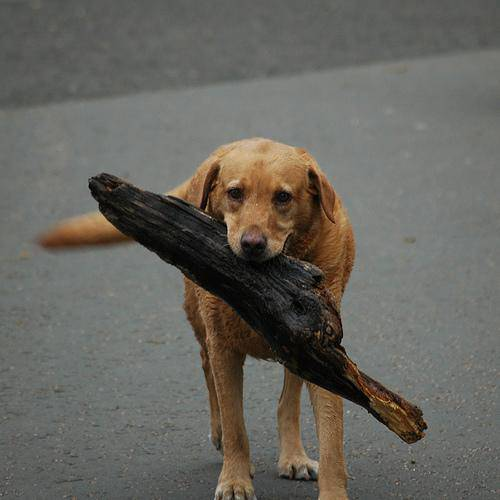

In [ ]:
from  IPython.display import  Image
Image("/content/drive/MyDrive/dogbreed/train/0021f9ceb3235effd7fcde7f7538ed62.jpg")

In [ ]:
# Create pathnames from image ID's
filenames = ["/content/drive/MyDrive/dogbreed/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['/content/drive/MyDrive/dogbreed/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/dogbreed/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/dogbreed/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/dogbreed/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/dogbreed/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/dogbreed/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/dogbreed/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/dogbreed/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/dogbreed/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/dogbreed/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("/content/drive/MyDrive/dogbreed/train/")) == len(filenames):
  print("Filenames match actual amount of files!!! Proceed.")
else:
  print("Filenames do no match actual amount of files, check the target directory.")

Filenames match actual amount of files!!! Proceed.


In [ ]:
len(os.listdir("/content/drive/MyDrive/dogbreed/train/"))

10222

In [ ]:
len(filenames)

10222

In [ ]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels) # does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data directories!")

Number of labels matches number of filenames!


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
X = filenames
X[:10]

['/content/drive/MyDrive/dogbreed/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/dogbreed/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/dogbreed/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/dogbreed/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/dogbreed/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/dogbreed/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/dogbreed/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/dogbreed/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/dogbreed/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/dogbreed/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
y=boolean_labels
y[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
# turn image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [ ]:
IMG_SIZE = 224

def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

In [ ]:
def get_image_label(image_path,label):
  image=process_image(image_path)
  return image,label



In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the iamge path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

NameError: name 'X_train' is not defined

In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [ ]:
train_data


<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

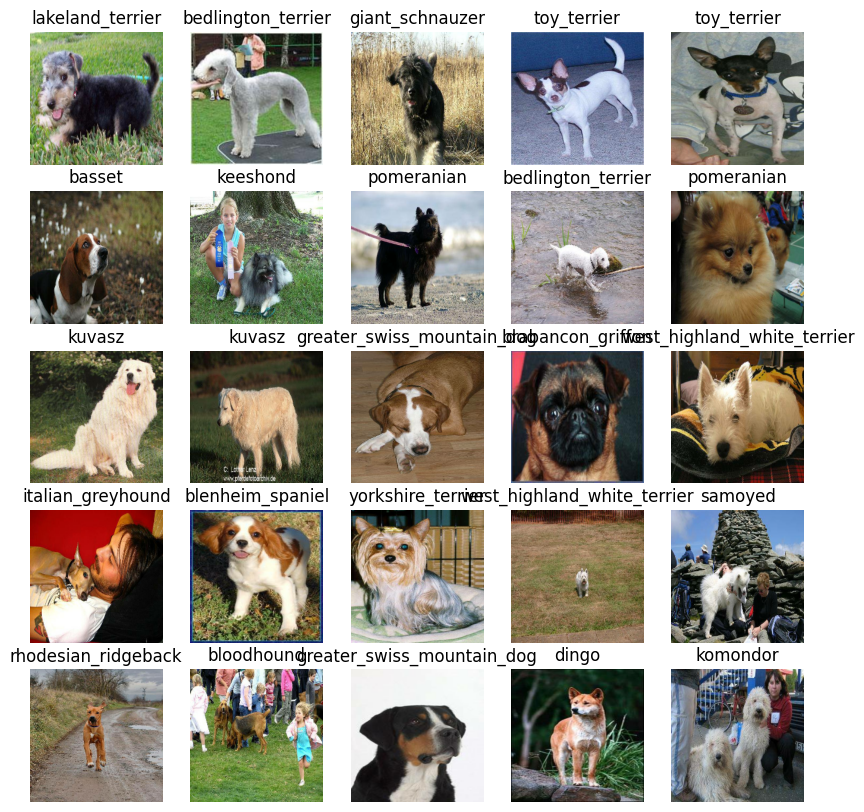

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

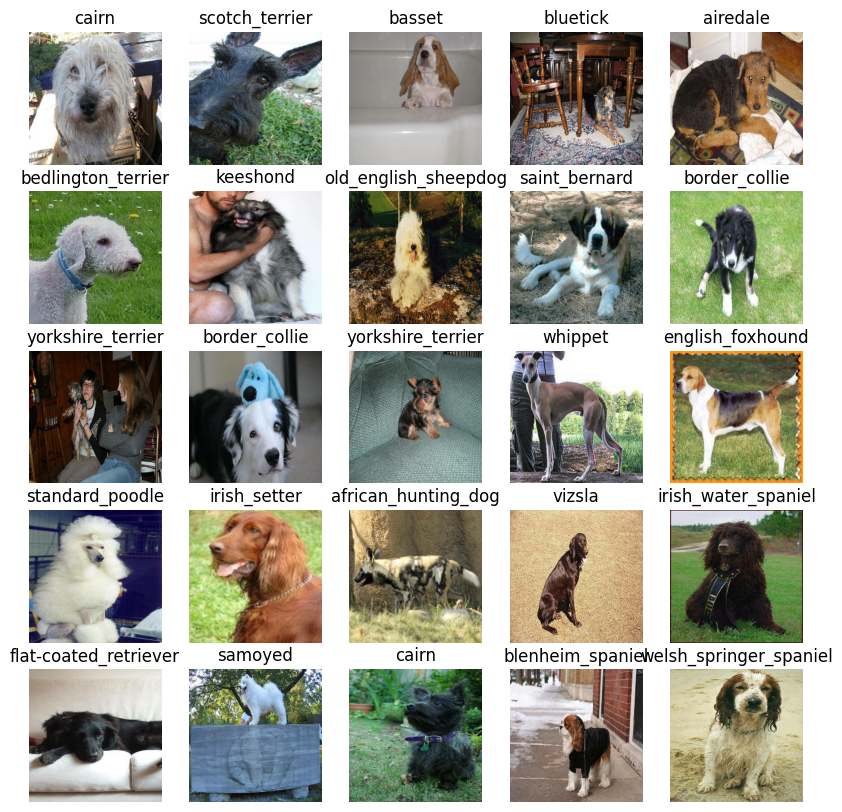

In [ ]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

In [ ]:
IMG_SIZE

224

In [ ]:

# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"


In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/My Drive/dogbreed/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Check to make sure we're still running on a GPU
print("GPU", "available (YESSS!!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESSS!!!!!!)


In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

In [ ]:
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 12s 219ms/step - loss: 4.6321 - accuracy: 0.0775 - val_loss: 3.3721 - val_accuracy: 0.2800
Epoch 2/100
25/25 [==============================] - 4s 167ms/step - loss: 1.6404 - accuracy: 0.6875 - val_loss: 2.1737 - val_accuracy: 0.5150
Epoch 3/100
25/25 [==============================] - 4s 149ms/step - loss: 0.5689 - accuracy: 0.9425 - val_loss: 1.6753 - val_accuracy: 0.6300
Epoch 4/100
25/25 [==============================] - 5s 202ms/step - loss: 0.2600 - accuracy: 0.9875 - val_loss: 1.4701 - val_accuracy: 0.6400
Epoch 5/100
25/25 [==============================] - 4s 177ms/step - loss: 0.1507 - accuracy: 0.9962 - val_loss: 1.3939 - val_accuracy: 0.6550
Epoch 6/100
25/25 [==============================] - 5s 188ms/step - loss: 0.1027 - accuracy: 1.0000 - val_loss: 1.3447 - val_accuracy: 0.6550
Epoch 7/100
25/25 [=============================

In [ ]:
%tensorboard --logdir drive/My\ Drive/dogbreed/logs

<IPython.core.display.Javascript object>

In [ ]:
val_data

NameError: name 'val_data' is not defined

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

2/7 [=======>......................] - ETA: 49s 

KeyboardInterrupt: 

In [ ]:
# First prediction
index = 199
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[6.17610815e-04 1.64521243e-05 1.52013113e-03 1.74904038e-04
 1.27117010e-03 1.59152523e-01 2.94166908e-04 4.40451168e-02
 2.44836527e-04 1.85162341e-03 1.55452537e-04 2.14072075e-02
 3.81837622e-03 2.74720090e-03 4.71319254e-05 2.87582842e-03
 2.83834198e-03 4.49153502e-03 4.69274959e-03 3.32506672e-02
 5.56941995e-05 5.31201586e-05 1.72849540e-02 4.80395211e-05
 5.39237342e-04 2.84109483e-05 1.30019005e-04 1.76863775e-01
 9.04986053e-04 4.44275001e-03 5.10526763e-04 2.19435518e-04
 7.11707471e-05 8.09521303e-02 4.33346868e-04 8.60653745e-05
 6.78593875e-04 4.59643925e-04 3.23846634e-03 2.10532569e-03
 1.34181674e-03 7.78248068e-04 1.47303939e-01 2.42846198e-02
 7.69327953e-03 1.47773517e-05 6.60317717e-04 2.11692444e-04
 1.65053934e-04 2.04252967e-04 4.99761896e-04 9.62750521e-04
 3.19746230e-03 2.58473065e-02 1.51795743e-03 7.49110850e-03
 9.64912877e-04 1.08829830e-04 7.81668175e-04 2.19662063e-04
 2.05123797e-03 1.88446268e-02 1.41579760e-04 3.42722945e-02
 4.02759870e-05 2.578257

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[199])
pred_label

NameError: name 'predictions' is not defined

In [ ]:
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and reutrns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[199], val_labels[199]

(array([[[0.6627451 , 0.62352943, 0.5764706 ],
         [0.6666667 , 0.627451  , 0.5803922 ],
         [0.6709034 , 0.6316877 , 0.5846289 ],
         ...,
         [0.67058825, 0.6313726 , 0.58431375],
         [0.6730042 , 0.6259454 , 0.57888657],
         [0.6730042 , 0.6259454 , 0.57888657]],
 
        [[0.6627451 , 0.62352943, 0.5764706 ],
         [0.6666667 , 0.627451  , 0.5803922 ],
         [0.6709034 , 0.6316877 , 0.5846289 ],
         ...,
         [0.6739624 , 0.63474673, 0.5876879 ],
         [0.6778362 , 0.63077736, 0.58371854],
         [0.6778362 , 0.63077736, 0.58371854]],
 
        [[0.6627451 , 0.62352943, 0.5764706 ],
         [0.6666667 , 0.627451  , 0.5803922 ],
         [0.6709034 , 0.6316877 , 0.5846289 ],
         ...,
         [0.6784314 , 0.6392157 , 0.5921569 ],
         [0.68658966, 0.63953084, 0.592472  ],
         [0.68658966, 0.63953084, 0.592472  ]],
 
        ...,
 
        [[0.7686275 , 0.7372549 , 0.6862745 ],
         [0.7686275 , 0.7372549 , 0.68627

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

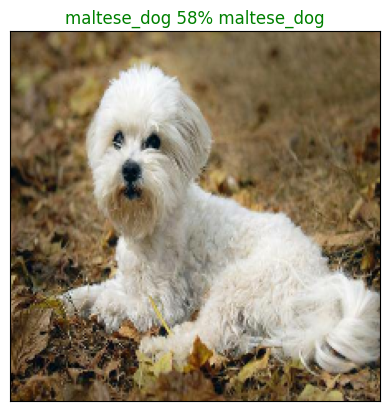

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=198)

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

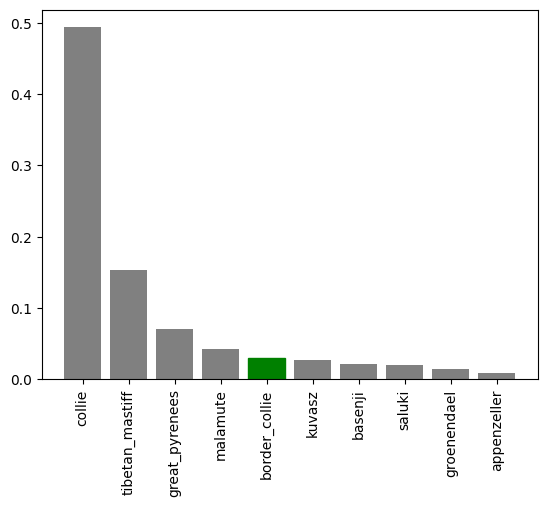

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

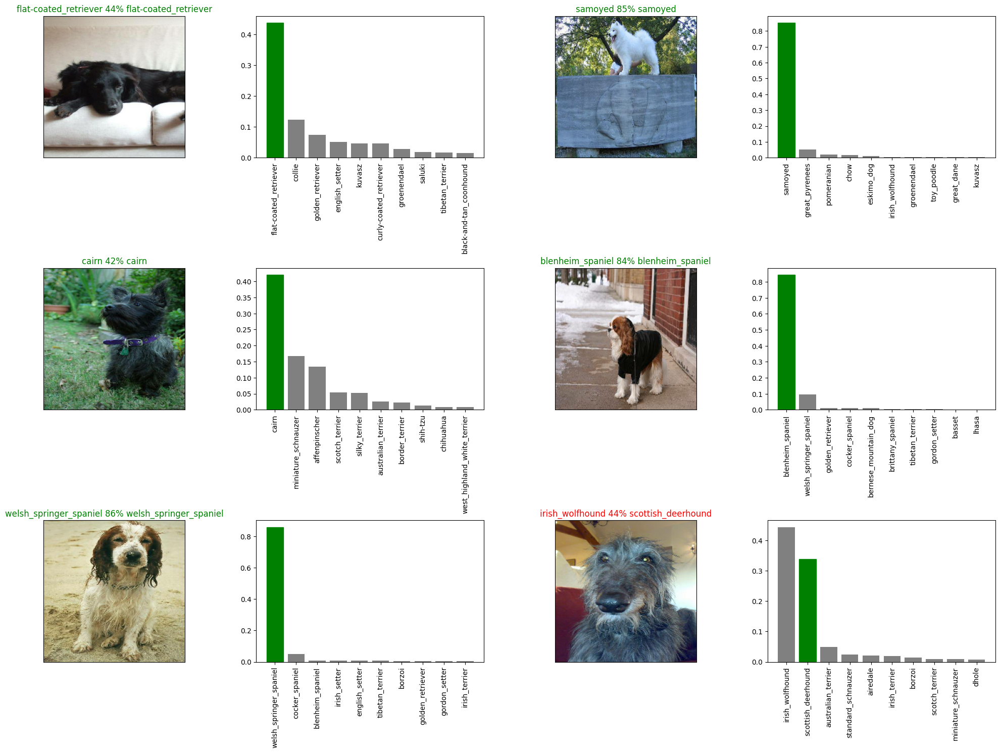

In [ ]:
# Let's check a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [ ]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.
  """
  # Create model directory with current time
  modeldir = os.path.join("drive/My Drive/dogbreed/Models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
save_model(model, suffix="1000-images-trained")

Saving model to: drive/My Drive/dogbreed/Models/20240610-20281718051283-1000-images-trained.h5...


'drive/My Drive/dogbreed/Models/20240610-20281718051283-1000-images-trained.h5'

In [ ]:
model_1000_images = load_model('/content/drive/MyDrive/dogbreed/Models/20240610-20281718051283-1000-images-trained.h5')

Loading saved model from: /content/drive/MyDrive/dogbreed/Models/20240610-20281718051283-1000-images-trained.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 161ms/step - loss: 1.2721 - accuracy: 0.6650


[1.2721127271652222, 0.6650000214576721]

In [ ]:
# Evaluate the loaded model
model_1000_images.evaluate(val_data)

7/7 [==============================] - 3s 232ms/step - loss: 1.2721 - accuracy: 0.6650


[1.2721127271652222, 0.6650000214576721]

# Training model on full dataset

In [ ]:
# Remind ourselves of the size of the full dataset
len(X), len(y)

(10222, 10222)

In [ ]:
# Turn full training data in a data batch
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
# Instantiate a new model for training on the full dataset
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks

# TensorBoard callback
full_model_tensorboard = create_tensorboard_callback()

# Early stopping callback
# Note: No validation set when training on all the data, therefore can't monitor validation accruacy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 50s 138ms/step - loss: 1.3397 - accuracy: 0.6673
Epoch 2/100
320/320 [==============================] - 42s 132ms/step - loss: 0.4027 - accuracy: 0.8783
Epoch 3/100
320/320 [==============================] - 44s 138ms/step - loss: 0.2382 - accuracy: 0.9337
Epoch 4/100
320/320 [==============================] - 41s 129ms/step - loss: 0.1536 - accuracy: 0.9637
Epoch 5/100
320/320 [==============================] - 44s 138ms/step - loss: 0.1063 - accuracy: 0.9790
Epoch 6/100
320/320 [==============================] - 43s 133ms/step - loss: 0.0800 - accuracy: 0.9840
Epoch 7/100
320/320 [==============================] - 44s 137ms/step - loss: 0.0587 - accuracy: 0.9928
Epoch 8/100
320/320 [==============================] - 44s 137ms/step - loss: 0.0473 - accuracy: 0.9931
Epoch 9/100
320/320 [==============================] - 40s 125ms/step - loss: 0.0376 - accuracy: 0.9969
Epoch 10/100
320/320 [==============================] - 42s 132m

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

NameError: name 'full_model' is not defined

In [ ]:
loaded_full_model = load_model('/content/drive/MyDrive/dogbreed/Models/20240610-21021718053364-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/dogbreed/Models/20240610-21021718053364-full-image-set-mobilenetv2-Adam.h5


In [ ]:
test_path = "drive/My Drive/dogbreed/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/My Drive/dogbreed/test/6389a1e579dda0ba8f3eb4a90235e517.jpg',
 'drive/My Drive/dogbreed/test/638d0f979c181b00c07a588299d8f5ff.jpg',
 'drive/My Drive/dogbreed/test/6391056507fbc0116c19a89bfa67f156.jpg',
 'drive/My Drive/dogbreed/test/639b6f96720f518076f502e209fa7cfd.jpg',
 'drive/My Drive/dogbreed/test/639fa1a5a3f68257666747cc86c647e5.jpg',
 'drive/My Drive/dogbreed/test/63a1aa34a5209888ebb99ba0248dcd31.jpg',
 'drive/My Drive/dogbreed/test/63a5b6073499c0ef434358e0fc664684.jpg',
 'drive/My Drive/dogbreed/test/63b0067bcb63e4107f2d9eed8846f15e.jpg',
 'drive/My Drive/dogbreed/test/63cb25a12cedf0bb90269dd3a9caae99.jpg',
 'drive/My Drive/dogbreed/test/63d381a8b806b56e3c155dd458a66646.jpg']

In [ ]:
len(test_filenames)

5070

In [ ]:
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

159/159 [==============================] - 191s 1s/step


In [ ]:
np.savetxt("drive/My Drive/dogbreed/preds_array.csv", test_predictions, delimiter=",")

Making predictions on custom images


In [ ]:
custom_path = "drive/My Drive/dogbreed/custom/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/My Drive/dogbreed/custom/gs2.jpeg',
 'drive/My Drive/dogbreed/custom/bg1.jpeg']

In [ ]:
custom_data = create_data_batches(custom_image_paths,test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
custom_preds = loaded_full_model.predict(custom_data, verbose=1)

1/1 [==============================] - 1s 941ms/step


In [ ]:
custom_preds.shape

(2, 120)

In [ ]:
custom_pred_labels=[get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['german_shepherd', 'beagle']